In [1]:
import functools
import math
import numpy as np
from tqdm import tqdm, trange

%pylab inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import torch
import torch.nn as nn
from torch.nn import init
import torch.optim as optim
import torch.nn.functional as F
from torch.nn import Parameter as P
from torch.distributions import MultivariateNormal, Normal, Independent, Uniform

import torchvision

import pyro 
from pyro.infer import MCMC, NUTS, HMC

from functools import partial

Populating the interactive namespace from numpy and matplotlib


In [2]:
import os
import sys

path_to_repo = os.path.join(os.getcwd(), 'BigGAN-PyTorch')
sys.path.append(path_to_repo)

In [3]:
import inception_utils
import utils
import losses

In [4]:
import classification as cl

In [5]:
import mh
#based on https://github.com/uber-research/metropolis-hastings-gans/blob/master/mhgan/mh.py
import torchvision.utils as vutils

In [6]:
def image_dump(X, name, dir_):
    '''This is to isolate torch stuff out.
    X : ndarray, shape (n, nc, image_size, image_size)
    name : str
    '''
    batch_size, nc, image_size, _ = X.shape
    assert X.shape == (batch_size, nc, image_size, image_size)

    fname = os.path.join(dir_, '%s.png' % name)
    vutils.save_image(torch.tensor(X), fname, normalize=True)

In [7]:
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms

def get_data_loader(dataroot, workers, image_size, batch_size):
    dataset = dset.ImageFolder(root=dataroot,
                               transform=transforms.Compose([
                                   transforms.Resize(image_size),
                                   transforms.CenterCrop(image_size),
                                   transforms.ToTensor(),
                                   transforms.Normalize((0.5, 0.5, 0.5),
                                                        (0.5, 0.5, 0.5)),
                               ]))

    data_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                              shuffle=True,
                                              num_workers=int(workers))
    return data_loader

In [8]:
arguments = ["--dataset", "I128_hdf5", "--parallel", "--shuffle", 
             "--num_workers", "8", "--batch_size", "36", 
             "--num_G_accumulations", "8", "--num_D_accumulations", "8", 
             "--num_D_steps", "1", "--G_lr", "1e-4", "--D_lr", "4e-4", 
             "--D_B2", "0.999", "--G_B2", "0.999", "--G_attn", "64", 
             "--D_attn", "64", "--G_ch", "96", "--D_ch", "96", 
             "--G_nl", "inplace_relu", "--D_nl", "inplace_relu",
             "--SN_eps", "1e-6", "--BN_eps", "1e-5", "--adam_eps", "1e-6", 
             "--G_ortho", "0.0", "--G_shared", "--G_init", "ortho", 
             "--D_init", "ortho", "--skip_init", "--hier", "--dim_z", "120",
             "--shared_dim", "128", "--ema", "--ema_start", "20000", 
             "--use_multiepoch_sampler", "--test_every", "2000",
             "--save_every", "1000", "--num_best_copies", "5", 
             "--num_save_copies",  "2", "--seed", "0", "--skip_init", 
             "--G_batch_size", "16", "--use_ema", "--G_eval_mode",
             "--sample_trunc_curves", "0.05_0.05_1.0",  
             "--sample_inception_metrics", "--sample_npz",
             "--samples_root", "/home/daniil/gans-mcmc/BigGAN-PyTorch/samples",
             "--sample_random", "--sample_sheets", "--sample_interps",
             "--experiment_name", "138k", 
             "--weights_root", "/home/daniil/gans-mcmc/BigGAN-PyTorch/weights"]

parser = utils.prepare_parser()
parser = utils.add_sample_parser(parser)
config = vars(parser.parse_args(arguments))
for key in config.keys():
    print(key, config[key])

dataset I128_hdf5
augment False
num_workers 8
pin_memory True
shuffle True
load_in_mem False
use_multiepoch_sampler True
model BigGAN
G_param SN
D_param SN
G_ch 96
D_ch 96
G_depth 1
D_depth 1
D_wide True
G_shared True
shared_dim 128
dim_z 120
z_var 1.0
hier True
cross_replica False
mybn False
G_nl inplace_relu
D_nl inplace_relu
G_attn 64
D_attn 64
norm_style bn
seed 0
G_init ortho
D_init ortho
skip_init True
G_lr 0.0001
D_lr 0.0004
G_B1 0.0
D_B1 0.0
G_B2 0.999
D_B2 0.999
batch_size 36
G_batch_size 16
num_G_accumulations 8
num_D_steps 1
num_D_accumulations 8
split_D False
num_epochs 100
parallel True
G_fp16 False
D_fp16 False
D_mixed_precision False
G_mixed_precision False
accumulate_stats False
num_standing_accumulations 16
G_eval_mode True
save_every 1000
num_save_copies 2
num_best_copies 5
which_best IS
no_fid False
test_every 2000
num_inception_images 50000
hashname False
base_root 
data_root data
weights_root /home/daniil/gans-mcmc/BigGAN-PyTorch/weights
logs_root logs
samples_root

# Downloading

In [9]:
state_dict = {'itr': 0, 'epoch': 0, 'save_num': 0, 'save_best_num': 0,
                'best_IS': 0, 'best_FID': 999999, 'config': config}
                
# Optionally, get the configuration from the state dict. This allows for
# recovery of the config provided only a state dict and experiment name,
# and can be convenient for writing less verbose sample shell scripts.
if config['config_from_name']:
    utils.load_weights(None, None, state_dict, config['weights_root'], 
                          config['experiment_name'], config['load_weights'], None,
                          strict=False, load_optim=False)
      # Ignore items which we might want to overwrite from the command line
    for item in state_dict['config']:
        if item not in ['z_var', 'base_root', 'batch_size', 'G_batch_size', 'use_ema', 'G_eval_mode']:
            config[item] = state_dict['config'][item]

# update config (see train.py for explanation)
config['resolution'] = utils.imsize_dict[config['dataset']]
config['n_classes'] = utils.nclass_dict[config['dataset']]
config['G_activation'] = utils.activation_dict[config['G_nl']]
config['D_activation'] = utils.activation_dict[config['D_nl']]
config = utils.update_config_roots(config)
config['skip_init'] = True
config['no_optim'] = True
device = 'cuda'

# Seed RNG
utils.seed_rng(config['seed'])
  
# Setup cudnn.benchmark for free speed
torch.backends.cudnn.benchmark = True

# Import the model--this line allows us to dynamically select different files.
model = __import__(config['model'])
experiment_name = (config['experiment_name'] if config['experiment_name']
                      else utils.name_from_config(config))
print('Experiment name is %s' % experiment_name)

Experiment name is 138k


In [10]:
G = model.Generator(**config).cuda()
utils.count_parameters(G)

D = model.Discriminator(**config).cuda()
utils.count_parameters(D)
# Load weights
print('Loading weights...')
# Here is where we deal with the ema--load ema weights or load normal weights
utils.load_weights(G if not (config['use_ema']) else None, D, state_dict, 
                    config['weights_root'], experiment_name, config['load_weights'],
                    G if config['ema'] and config['use_ema'] else None,
                    strict=False, load_optim=False)
# Update batch size setting used for G
G_batch_size = max(config['G_batch_size'], config['batch_size']) 
z_, y_ = utils.prepare_z_y(G_batch_size, G.dim_z, config['n_classes'],
                            device=device, fp16=config['G_fp16'], 
                            z_var=config['z_var'])

if config['G_eval_mode']:
    print('Putting G and D in eval mode..')
    G.eval()
    D.eval()
else:
    print('G is in %s mode...' % ('training' if G.training else 'eval'))
    print('D is in %s mode...' % ('training' if D.training else 'eval'))
    
for p in D.parameters():  
    p.requires_grad = False
for p in G.parameters():  
    p.requires_grad = False

Adding attention layer in G at resolution 64
Number of parameters: 70433988
Adding attention layer in D at resolution 64
Number of parameters: 87982370
Loading weights...
Loading weights from /home/daniil/gans-mcmc/BigGAN-PyTorch/weights/138k...
Putting G and D in eval mode..


# Example of generator images

In [9]:
sample = functools.partial(utils.sample, G=G, z_=z_, y_=y_, config=config)  

In [8]:
if config['sample_random']:
    print('Preparing random sample sheet...')
    with torch.no_grad():
        z_.sample_()
        y_ = 850*torch.ones(z_.shape[0], dtype=torch.long).to(z_.device)
        if config['parallel']:
            G_z =  nn.parallel.data_parallel(G, (z_, G.shared(y_)))
        else:
            G_z = G(z_, G.shared(y_))
            
    images, labels = G_z, y_
    torchvision.utils.save_image(images.float(),
                                 '%s/%s/random_samples.jpg' % (config['samples_root'], experiment_name),
                                 nrow=int(G_batch_size**0.5),
                                 normalize=True)

Preparing random sample sheet...


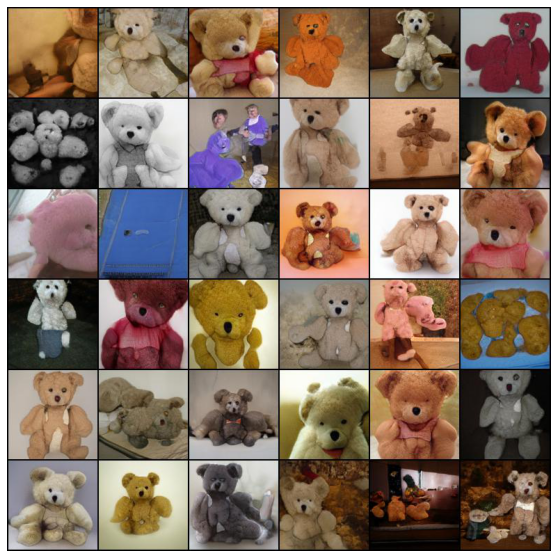

In [9]:
fig, ax = subplots(figsize=(10, 10))
img = mpimg.imread('%s/%s/random_samples.jpg' % (config['samples_root'], experiment_name))
ax.imshow(img)
ax.axis('off')
plt.show()

In [10]:
def sample(G, z_, y_, config):
    with torch.no_grad():
        z_.sample_()
        y_.sample_()
        if config['parallel']:
            G_z =  nn.parallel.data_parallel(G, (z_, G.shared(y_)))
        else:
            G_z = G(z_, G.shared(y_))
            
        return G_z, y_

In [10]:
z_.shape

(36, 120)

In [40]:
num_clas = 
with torch.no_grad():
    z_.sample_()
    y_ = 850*torch.ones(z_.shape[0], dtype=torch.long).to(z_.device)
    if config['parallel']:
        G_z =  nn.parallel.data_parallel(G, (z_, G.shared(y_)))
    else:
        G_z = G(z_, G.shared(y_))

images, labels = G_z, y_

TypeError: gen_disc_f() missing 1 required positional argument: 'batch_size_fixed_'

In [ ]:
numpy_images = data[0].detach().cpu().numpy().transpose(0, 2, 3, 1)
numpy_images = (numpy_images - numpy_images.min())/(numpy_images.max() - numpy_images.min())
nrow = int(batch_size_fixed**0.5)
fig = plt.figure(figsize=(10, 10))
axes = fig.subplots(nrow, nrow)
for k in range(batch_size_fixed):
    i = k // nrow
    j = k % nrow
    #axes[i][j].imshow(np.clip(numpy_images[k], 0, 1))
    axes[i][j].imshow(numpy_images[k])
    axes[i][j].axis('off')
plt.show()

# Script for downloading images from ImageNet

https://github.com/itf/imagenet-download - taken from here

python imagenetDownloader.py n12144580 imagenet_corn -S --images=100 --minsize=7000 -j10

# Dataloader and plotting

In [10]:
batch_size_fixed = 16
device = torch.device('cuda:0')
nz = G.dim_z
BASE_D = 'base'
num_class = 998


def gen_f(batch_size_fixed_=batch_size_fixed, num_class=num_class):
        noise = torch.randn(batch_size_fixed_, nz, device=device)
        y_ = num_class*torch.ones((batch_size_fixed_, ), dtype=torch.long).to(device)
        x = G(noise, G.shared(y_)).detach()
        #x = x.cpu().numpy()
        x = x.cpu()
        return x

def gen_disc_f(batch_size_fixed_=batch_size_fixed, num_class=num_class):
    noise = torch.randn(batch_size_fixed_, nz, device=device)
    y_ = num_class*torch.ones((batch_size_fixed_, ), dtype=torch.long).to(device)
    x = G(noise, G.shared(y_)).detach()
    scores = {BASE_D: D(x, y_).detach().cpu().numpy()}
    #x = x.cpu().numpy()
    x = x.cpu()
    return x, scores

In [12]:
wnid_teddy_bears = 'n04399382'
wnid_corn = 'n12144580'

In [87]:
batch_size_fixed = 64
images = gen_f(batch_size_fixed_ = batch_size_fixed, num_class=998)

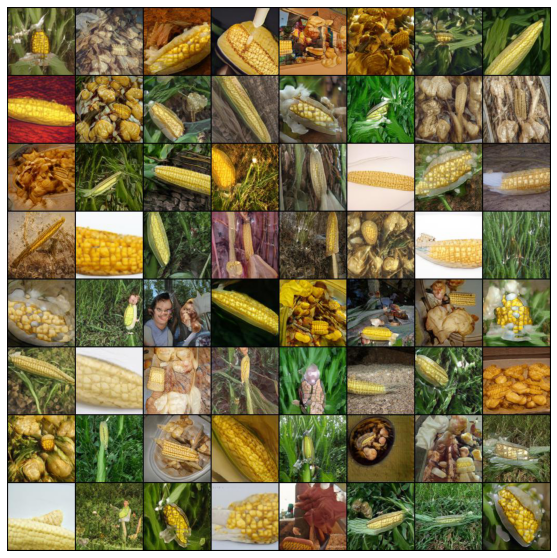

In [88]:
save_images = '%s/%s/corn_samples.jpg' % (config['samples_root'], experiment_name)
torchvision.utils.save_image(images,
                             save_images,
                             nrow=int(batch_size_fixed**0.5),
                             normalize=True)

fig, ax = subplots(figsize=(10, 10))
img = mpimg.imread(save_images)
ax.imshow(img)
ax.axis('off')
plt.show()

In [22]:
images, scores = gen_disc_f()

In [24]:
scores

{'base': array([[-3.055484  ],
        [-1.6296477 ],
        [-0.2693944 ],
        [-0.03041041],
        [-6.7312455 ],
        [-2.7220712 ],
        [ 0.9744473 ],
        [-3.1632185 ],
        [-3.5325863 ],
        [-5.470829  ],
        [-4.027464  ],
        [-3.779909  ],
        [-4.3181047 ],
        [-4.967715  ],
        [-3.2656403 ],
        [-3.735251  ]], dtype=float32)}

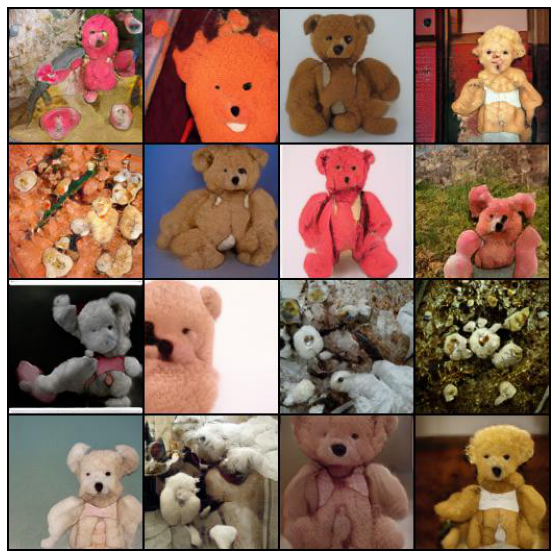

In [25]:
save_images = '%s/%s/mhgan.jpg' % (config['samples_root'], experiment_name)
torchvision.utils.save_image(images,
                             save_images,
                             nrow=int(batch_size_fixed**0.5),
                             normalize=True)

fig, ax = subplots(figsize=(10, 10))
img = mpimg.imread(save_images)
ax.imshow(img)
ax.axis('off')
plt.show()

In [10]:
workers = 4
dataroot = 'imagenet_corn'
image_size = 128
batch_size = 16
corn_dataset = get_data_loader(dataroot, workers, image_size, batch_size)

In [42]:
len(corn_dataset)

7

In [11]:
for i, data in enumerate(corn_dataset, 0):
    break

In [12]:
data[0].shape

torch.Size([16, 3, 128, 128])

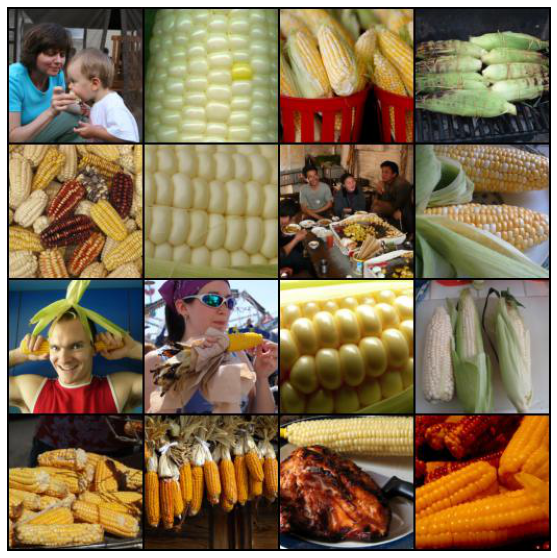

In [16]:
save_images = '%s/%s/сorn_imagenet.jpg' % (config['samples_root'], experiment_name)
torchvision.utils.save_image(data[0],
                             save_images,
                             nrow=int(batch_size_fixed**0.5),
                             normalize=True)

fig, ax = subplots(figsize=(10, 10))
img = mpimg.imread(save_images)
ax.imshow(img)
ax.axis('off')
plt.show()

In [18]:
y_ = num_class*torch.ones((batch_size_fixed, ), dtype=torch.long).to(device)

In [21]:
real_score = D(data[0].to(device), y_)

In [22]:
real_score

tensor([[ 5.4946],
        [ 9.9061],
        [ 4.7991],
        [-0.2569],
        [-1.4619],
        [13.4506],
        [-0.9865],
        [ 4.3815],
        [ 4.4488],
        [-2.2522],
        [12.5546],
        [ 0.4458],
        [-0.9452],
        [ 2.4833],
        [ 1.9081],
        [ 1.0685]], device='cuda:0')

In [24]:
images, fake_scores = gen_disc_f()

In [25]:
fake_scores

{'base': array([[-5.727922  ],
        [-2.047769  ],
        [-4.000046  ],
        [-3.2247353 ],
        [-0.20495296],
        [-5.00583   ],
        [-2.050461  ],
        [-1.1979814 ],
        [-3.6445239 ],
        [-3.6722    ],
        [-4.8677473 ],
        [-2.308618  ],
        [-3.580715  ],
        [-3.18426   ],
        [-1.3037294 ],
        [-5.2996664 ]], dtype=float32)}

In [37]:
numpy_images[0]

array([[[-0.52156866, -0.5294118 , -0.5686275 ],
        [-0.5058824 , -0.5058824 , -0.56078434],
        [-0.47450978, -0.47450978, -0.5372549 ],
        ...,
        [-0.7647059 , -0.77254903, -0.8039216 ],
        [-0.75686276, -0.7647059 , -0.8039216 ],
        [-0.73333335, -0.7254902 , -0.7647059 ]],

       [[-0.47450978, -0.4823529 , -0.52156866],
        [-0.45098037, -0.4588235 , -0.5058824 ],
        [-0.4352941 , -0.4352941 , -0.4980392 ],
        ...,
        [-0.77254903, -0.78039217, -0.8117647 ],
        [-0.77254903, -0.78039217, -0.8117647 ],
        [-0.75686276, -0.7490196 , -0.7882353 ]],

       [[-0.38823527, -0.3960784 , -0.4352941 ],
        [-0.38823527, -0.3960784 , -0.4352941 ],
        [-0.40392154, -0.40392154, -0.4588235 ],
        ...,
        [-0.7647059 , -0.77254903, -0.8039216 ],
        [-0.7882353 , -0.79607844, -0.827451  ],
        [-0.78039217, -0.77254903, -0.8117647 ]],

       ...,

       [[-0.09019607, -0.34117645, -0.49019605],
        [-0

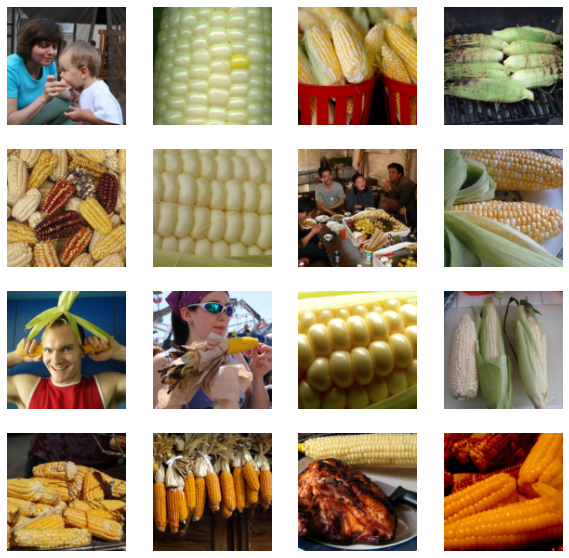

In [41]:
numpy_images = data[0].detach().cpu().numpy().transpose(0, 2, 3, 1)
numpy_images = (numpy_images - numpy_images.min())/(numpy_images.max() - numpy_images.min())
nrow = int(batch_size_fixed**0.5)
fig = plt.figure(figsize=(10, 10))
axes = fig.subplots(nrow, nrow)
for k in range(batch_size_fixed):
    i = k // nrow
    j = k % nrow
    #axes[i][j].imshow(np.clip(numpy_images[k], 0, 1))
    axes[i][j].imshow(numpy_images[k])
    axes[i][j].axis('off')
plt.show()

In [ ]:
images, fake_scores = gen_disc_f()

# MHGAN

Based on https://github.com/uber-research/metropolis-hastings-gans/blob/master/mhgan/demo_mhgan.py

In [11]:
from mhgan_utils import (validate_scores, validate_X,
                         validate, batched_gen_and_disc,
                         discriminator_analysis, base,
                         enhance_samples, enhance_samples_series)

In [12]:
workers = 4
dataroot = 'imagenet_corn'
image_size = 128
batch_size = 16
num_class = 998
device = torch.device('cuda:0')
nz = G.dim_z
LABEL = 'label'
corn_dataloader = get_data_loader(dataroot, workers, image_size, batch_size)

In [13]:
real_calib_data = []
for i, data in enumerate(corn_dataloader, 0):
    real_calib_data.append(data[0])

In [14]:
len(real_calib_data)

48

In [15]:
48*16

768

In [16]:
from numpy import concatenate as concat
import pandas as pd

In [17]:
num_class

998

In [18]:
BASE_D = 'base'
scores_real = {}
scores_real[BASE_D] = concat([D(data.to(device), 
                                num_class*torch.ones((data.shape[0], ), 
                                                     dtype=torch.long).to(device)).sigmoid().detach().cpu().numpy()
                                for data in real_calib_data])
scores_real[BASE_D] = scores_real[BASE_D][:, 0]

In [19]:
scores_real[BASE_D].shape

(768,)

In [20]:
(scores_real[BASE_D] > 0.7).sum()

450

In [21]:
scores_real_df = validate_scores(scores_real)

In [22]:
scores_real_df

,base
0,0.510246
1,0.996584
2,0.964788
3,0.476399
4,0.869511
...,...
763,0.998422
764,0.049650
765,0.261513
766,0.061339


In [27]:
(scores_real_df[BASE_D] > 0.7).sum()

450

In [28]:
n_real_batches, rem = divmod(len(scores_real[BASE_D]), batch_size)

In [29]:
n_real_batches

48

In [26]:
def gen_disc_f(batch_size_fixed_):
    noise = torch.randn(batch_size_fixed_, nz, device=device)
    y_ = num_class*torch.ones((batch_size_fixed_, ), dtype=torch.long).to(device)
    x = G(noise, G.shared(y_)).detach()
    scores = {BASE_D: D(x, y_).sigmoid().detach().cpu().numpy()[:, 0]}
    x = x.cpu().numpy()
    return x, scores

In [30]:
_, scores_fake_df = batched_gen_and_disc(gen_disc_f, n_real_batches, batch_size)

In [31]:
(scores_fake_df[BASE_D] > 0.7).sum()

10

In [32]:
outf = 'temp'
outf = os.path.abspath(os.path.expanduser(outf))

print('using dump folder:')
print(outf)

using dump folder:
/home/daniil/gans-mcmc/temp


In [33]:
outf

'/home/daniil/gans-mcmc/temp'

In [34]:
epoch = 0
ref_method = (BASE_D, 'raw')
incep_ref = BASE_D + '_iso_base'
score_fname = os.path.join(outf, '%d_scores.csv' % epoch)
calib_dict = {'iso': cl.Isotonic}
#perf_report, calib_report, clf_df = \
#    discriminator_analysis(scores_fake_df, scores_real_df, ref_method,
#                           dump_fname=score_fname)
pred_df_dump, clf_df = \
     discriminator_analysis(scores_fake_df, scores_real_df, ref_method,
                            calib_dict=calib_dict,
                            dump_fname=score_fname)

In [35]:
pred_df_dump

,base_iso,label
0,0.338462,False
1,0.000000,False
2,0.338462,False
3,0.052632,False
4,0.233333,False
...,...,...
763,1.000000,True
764,1.000000,True
765,1.000000,True
766,0.083333,True


In [45]:
#PICK_DICT = {'MH': mh.mh_sample, 'base': base, 'reject': mh.rejection_sample}
#PICK_DICT = {'MH': mh.mh_sample}
PICK_DICT = {'MH': mh.mh_sample}

In [37]:
print('image dumps...')
# Some image dumps in case we want to actually look at generated images
pickers = {'MH': mh.mh_sample}
X, picked, cap_out, alpha = enhance_samples_series(gen_disc_f, scores_real_df, 
                                                   clf_df, pickers)

image dumps...
max scores
base    0.969907


/home/daniil/gans-mcmc/mh.py:48: RuntimeWarning: divide by zero encountered in true_divide
  odds_ratio = 1.0 / ((1.0 / P_disc) - 1.0)


number of selected images = 1 out of 160


/home/daniil/gans-mcmc/mh.py:48: RuntimeWarning: divide by zero encountered in true_divide
  odds_ratio = 1.0 / ((1.0 / P_disc) - 1.0)


number of selected images = 1 out of 160


/home/daniil/gans-mcmc/mh.py:48: RuntimeWarning: divide by zero encountered in true_divide
  odds_ratio = 1.0 / ((1.0 / P_disc) - 1.0)
/home/daniil/gans-mcmc/mh.py:68: RuntimeWarning: divide by zero encountered in double_scalars
  alpha = ((1.0 / P_disc_last) - 1.0) / ((1.0 / P_disc_new) - 1.0)


number of selected images = 1 out of 160


/home/daniil/gans-mcmc/mh.py:48: RuntimeWarning: divide by zero encountered in true_divide
  odds_ratio = 1.0 / ((1.0 / P_disc) - 1.0)


number of selected images = 1 out of 160


/home/daniil/gans-mcmc/mh.py:48: RuntimeWarning: divide by zero encountered in true_divide
  odds_ratio = 1.0 / ((1.0 / P_disc) - 1.0)
/home/daniil/gans-mcmc/mh.py:68: RuntimeWarning: invalid value encountered in double_scalars
  alpha = ((1.0 / P_disc_last) - 1.0) / ((1.0 / P_disc_new) - 1.0)


number of selected images = 1 out of 160


/home/daniil/gans-mcmc/mh.py:48: RuntimeWarning: divide by zero encountered in true_divide
  odds_ratio = 1.0 / ((1.0 / P_disc) - 1.0)


number of selected images = 1 out of 160


/home/daniil/gans-mcmc/mh.py:48: RuntimeWarning: divide by zero encountered in true_divide
  odds_ratio = 1.0 / ((1.0 / P_disc) - 1.0)
/home/daniil/gans-mcmc/mh.py:68: RuntimeWarning: divide by zero encountered in double_scalars
  alpha = ((1.0 / P_disc_last) - 1.0) / ((1.0 / P_disc_new) - 1.0)


number of selected images = 1 out of 160


/home/daniil/gans-mcmc/mh.py:48: RuntimeWarning: divide by zero encountered in true_divide
  odds_ratio = 1.0 / ((1.0 / P_disc) - 1.0)


number of selected images = 1 out of 160


/home/daniil/gans-mcmc/mh.py:48: RuntimeWarning: divide by zero encountered in true_divide
  odds_ratio = 1.0 / ((1.0 / P_disc) - 1.0)
/home/daniil/gans-mcmc/mh.py:68: RuntimeWarning: invalid value encountered in double_scalars
  alpha = ((1.0 / P_disc_last) - 1.0) / ((1.0 / P_disc_new) - 1.0)


number of selected images = 1 out of 160


/home/daniil/gans-mcmc/mh.py:48: RuntimeWarning: divide by zero encountered in true_divide
  odds_ratio = 1.0 / ((1.0 / P_disc) - 1.0)


number of selected images = 1 out of 160


/home/daniil/gans-mcmc/mh.py:48: RuntimeWarning: divide by zero encountered in true_divide
  odds_ratio = 1.0 / ((1.0 / P_disc) - 1.0)
/home/daniil/gans-mcmc/mh.py:68: RuntimeWarning: invalid value encountered in double_scalars
  alpha = ((1.0 / P_disc_last) - 1.0) / ((1.0 / P_disc_new) - 1.0)


number of selected images = 1 out of 160


/home/daniil/gans-mcmc/mh.py:48: RuntimeWarning: divide by zero encountered in true_divide
  odds_ratio = 1.0 / ((1.0 / P_disc) - 1.0)


number of selected images = 1 out of 160


/home/daniil/gans-mcmc/mh.py:48: RuntimeWarning: divide by zero encountered in true_divide
  odds_ratio = 1.0 / ((1.0 / P_disc) - 1.0)


number of selected images = 1 out of 160


/home/daniil/gans-mcmc/mh.py:48: RuntimeWarning: divide by zero encountered in true_divide
  odds_ratio = 1.0 / ((1.0 / P_disc) - 1.0)
/home/daniil/gans-mcmc/mh.py:68: RuntimeWarning: invalid value encountered in double_scalars
  alpha = ((1.0 / P_disc_last) - 1.0) / ((1.0 / P_disc_new) - 1.0)


number of selected images = 1 out of 160


/home/daniil/gans-mcmc/mh.py:48: RuntimeWarning: divide by zero encountered in true_divide
  odds_ratio = 1.0 / ((1.0 / P_disc) - 1.0)
/home/daniil/gans-mcmc/mh.py:68: RuntimeWarning: invalid value encountered in double_scalars
  alpha = ((1.0 / P_disc_last) - 1.0) / ((1.0 / P_disc_new) - 1.0)


number of selected images = 1 out of 160
number of selected images = 1 out of 160
acceptance rate = 0.00625


/home/daniil/gans-mcmc/mh.py:48: RuntimeWarning: divide by zero encountered in true_divide
  odds_ratio = 1.0 / ((1.0 / P_disc) - 1.0)
/home/daniil/gans-mcmc/mh.py:68: RuntimeWarning: divide by zero encountered in double_scalars
  alpha = ((1.0 / P_disc_last) - 1.0) / ((1.0 / P_disc_new) - 1.0)


In [134]:
X.shape

(16, 3, 128, 128)

In [125]:
23/(16*10*16)

0.008984375

In [116]:
alpha

base                                        
         raw                      iso               
          MH base    reject        MH base    reject
0   0.225881  1.0  0.188385  1.000000  1.0  0.172414
1   1.000000  1.0  0.540781  1.000000  1.0  0.583909
2   1.000000  1.0  0.118356  1.000000  1.0  0.500000
3   1.000000  1.0  0.219967  0.445129  1.0  0.500000
4   0.673114  1.0  0.023458  1.000000  1.0  0.032710
5   0.849744  1.0  0.637088  1.000000  1.0  0.095324
6   1.000000  1.0  0.571469  0.737968  1.0  0.583909
7   1.000000  1.0  0.357550  0.247848  1.0  0.301696
8   1.000000  1.0  0.647669  1.000000  1.0  0.014273
9   1.000000  1.0  0.251292  1.000000  1.0  0.497680
10  0.814598  1.0  0.499600  1.000000  1.0  0.500000
11  1.000000  1.0  0.616498  1.000000  1.0  0.588235
12  0.092876  1.0  0.511905  0.669565  1.0  0.097561
13  0.295397  1.0  0.085919  1.000000  1.0  0.317972
14  1.000000  1.0  0.274464  1.000000  1.0  0.235398
15  1.000000  1.0  0.869413  1.000000  1.0  0.928051

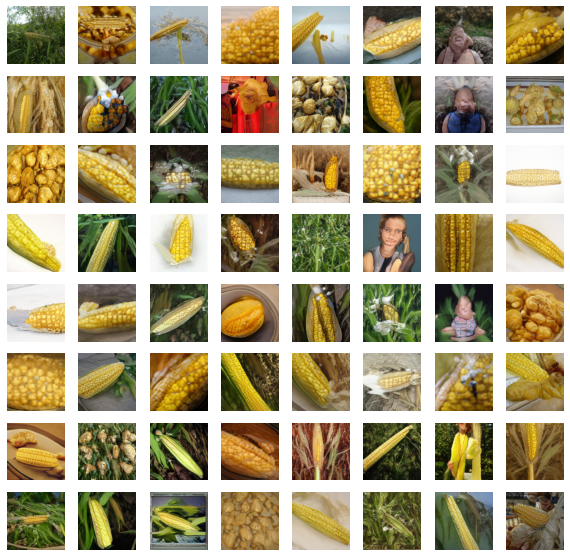

In [82]:
batch_size_fixed = 64
numpy_images = X[:batch_size_fixed].transpose(0, 2, 3, 1)
numpy_images = (numpy_images - numpy_images.min())/(numpy_images.max() - numpy_images.min())
nrow = int(batch_size_fixed**0.5)
fig = plt.figure(figsize=(10, 10))
axes = fig.subplots(nrow, nrow)
for k in range(batch_size_fixed):
    i = k // nrow
    j = k % nrow
    #axes[i][j].imshow(np.clip(numpy_images[k], 0, 1))
    axes[i][j].imshow(numpy_images[k])
    axes[i][j].axis('off')
plt.show()

In [38]:
def mh_sample_acceptence(d_score, score_max=None, random=np.random):
    assert(np.ndim(d_score) == 1 and len(d_score) > 0)
    assert(0 <= np.min(d_score) and np.max(d_score) <= 1)

    OR = mh.disc_2_odds_ratio(d_score)
    OR_U = OR / random.rand(len(d_score))

    picked_round = 0
    alpha = 1.0
    number_of_acceptence = 1
    for ii in range(1, len(d_score)):
        if OR[picked_round] <= OR_U[ii]:
            alpha = mh.accept_prob_MH_disc(d_score[picked_round], d_score[ii])
            picked_round = ii
            number_of_acceptence += 1
    
    acceptence_rate = number_of_acceptence/len(d_score)
    return picked_round, alpha, acceptence_rate

In [50]:
batch_size = 16   # Batch size to use when calling the pytorch generator G
chain_batches = 10  # Number of batches to use total for the pickers
max_est_batches = 156  # Num batches for estimating M in DRS pilot samples

In [51]:
X_, scores_fake_df = batched_gen_and_disc(gen_disc_f, chain_batches, batch_size)

In [52]:
scores_fake_df

,base
0,0.004174
1,0.099056
2,0.214770
3,0.058220
4,0.050313
...,...
155,0.029010
156,0.000722
157,0.107761
158,0.074842


In [53]:
init_idx = np.random.choice(len(scores_real_df))

In [54]:
init_idx

126

In [59]:
init_idx = np.random.choice(len(scores_real_df))
disc_name =  'base'
calib_name = 'iso'
calibrator = clf_df[(disc_name, calib_name)]
s0 = scores_real_df[disc_name].values[init_idx]
s_ = np.concatenate(([s0], scores_fake_df[disc_name].values))

In [60]:
s0

0.99351245

In [179]:
s_.shape

(161,)

In [177]:
s_

array([9.71036971e-01, 7.96081591e-03, 1.65624395e-02, 2.24267063e-03,
       7.93240033e-03, 1.86883993e-02, 1.02762375e-02, 4.81153280e-03,
       2.73915287e-03, 1.60079196e-01, 9.29010138e-02, 9.80783440e-03,
       3.00527904e-02, 2.68949773e-02, 8.92626122e-02, 4.52749897e-03,
       1.24909356e-03, 6.59223199e-02, 5.16943112e-02, 6.17240489e-01,
       6.34490792e-03, 1.48757294e-01, 3.70951854e-02, 1.41264617e-01,
       4.78345063e-03, 3.81384906e-03, 4.97139879e-02, 2.24125921e-03,
       1.36919379e-01, 2.50844993e-02, 6.77640317e-04, 1.83012001e-02,
       5.99597931e-01, 2.33179443e-02, 1.48736024e-02, 5.64291105e-02,
       1.02393972e-02, 1.74924303e-02, 5.50522134e-02, 1.78549215e-01,
       6.68349629e-03, 3.48340422e-01, 1.49845947e-02, 2.48078793e-01,
       1.26242954e-02, 8.42004549e-03, 3.88370156e-02, 3.00320494e-03,
       4.05907370e-02, 3.44009954e-03, 2.03238726e-02, 6.79104496e-03,
       8.26547816e-02, 1.90328285e-01, 1.71021034e-03, 1.32094398e-02,
      

In [180]:
s_ = calibrator.predict(s_)

In [181]:
s_

array([0.9736842 , 0.05263158, 0.08163265, 0.        , 0.05263158,
       0.10204082, 0.08163265, 0.03225806, 0.        , 0.45454547,
       0.31914893, 0.08163265, 0.10204082, 0.10204082, 0.31914893,
       0.        , 0.        , 0.18421052, 0.18421052, 0.90909094,
       0.03225806, 0.4       , 0.12820514, 0.4       , 0.03225806,
       0.        , 0.18421052, 0.        , 0.4       , 0.10204082,
       0.        , 0.08163265, 0.90909094, 0.10204082, 0.08163265,
       0.18421052, 0.08163265, 0.08163265, 0.18421052, 0.45454547,
       0.03225806, 0.627907  , 0.08163265, 0.5625    , 0.08163265,
       0.05263158, 0.12820514, 0.        , 0.12820514, 0.        ,
       0.10204082, 0.03225806, 0.31914893, 0.45454547, 0.        ,
       0.08163265, 0.45454547, 0.7924528 , 0.        , 0.10204082,
       0.08163265, 0.19406673, 0.        , 0.        , 0.18421052,
       0.10204082, 0.03225806, 0.10204082, 0.        , 0.7924528 ,
       0.15353106, 0.12820514, 0.45454547, 0.08163265, 0.18421

In [182]:
picked_round, alpha, acceptence_score = mh_sample_acceptence(s_)

/home/daniil/gans-mcmc/mh.py:48: RuntimeWarning: divide by zero encountered in true_divide
  odds_ratio = 1.0 / ((1.0 / P_disc) - 1.0)


In [183]:
acceptence_score

0.11180124223602485

In [39]:
batch_size = 16   # Batch size to use when calling the pytorch generator G
chain_batches = 30
acceptence_scores_arr = []
num_averages = 1
for nn in range(num_averages):
    X_, scores_fake_df = \
        batched_gen_and_disc(gen_disc_f, chain_batches, batch_size)
    init_idx = np.random.choice(len(scores_real_df))
    disc_name =  'base'
    calib_name = 'iso'
    calibrator = clf_df[(disc_name, calib_name)]
    s0 = scores_real_df[disc_name].values[init_idx]
    s_ = np.concatenate(([s0], scores_fake_df[disc_name].values))
    s_ = calibrator.predict(s_)
    picked_round, alpha, acceptence_score = mh_sample_acceptence(s_)
    acceptence_scores_arr.append(acceptence_score)
acceptence_scores_arr = np.array(acceptence_scores_arr)
print(acceptence_scores_arr.mean())

0.09355509355509356


/home/daniil/gans-mcmc/mh.py:48: RuntimeWarning: divide by zero encountered in true_divide
  odds_ratio = 1.0 / ((1.0 / P_disc) - 1.0)
/home/daniil/gans-mcmc/mh.py:68: RuntimeWarning: divide by zero encountered in double_scalars
  alpha = ((1.0 / P_disc_last) - 1.0) / ((1.0 / P_disc_new) - 1.0)


In [62]:
acceptence_scores_arr

array([0.09355509])

# Langevin dynamics

In [11]:
def Langevin_sampling(G, D, y_,
                      z_dim, eps, num_iter, device):
    loc = torch.zeros(z_dim).to(device)
    scale = torch.ones(z_dim).to(device)
    normal = Normal(loc, scale)
    diagn = Independent(normal, 1)
    cur_z = diagn.sample()
    cur_z = torch.unsqueeze(cur_z, 0)
    cur_z.requires_grad_(True)
    latent_arr = [cur_z.clone()]
    y_shared = G.shared(y_)
    y_shared.detach()
    
    for i in range(num_iter - 1):
        print(f"i = {i}")
        GAN_part = -D(G(cur_z, y_shared), y_)
        latent_part = -diagn.log_prob(cur_z)
        energy = GAN_part + latent_part 
        energy.backward()
        utils.seed_rng(i)
        noise = diagn.sample()
        #print(noise.shape)
        #print(cur_z.grad.shape)
        with torch.no_grad():
            cur_z -= (eps/2*cur_z.grad - (eps ** 0.5)*noise)
            
        latent_arr.append(cur_z.clone())
    
    latent_arr = torch.stack(latent_arr, dim = 0)
   
    return latent_arr

In [14]:
cur_eps = 5e-3
z_.sample_()
z_dim = z_.shape[1]
num_class = 850
y_ = num_class*torch.ones((1, ), dtype=torch.long).to(z_.device)
G_batch_size = 36
# Seed RNG
utils.seed_rng(config['seed'])

print(f"Langevin dynamics with eps = {cur_eps}")
latent_arr = Langevin_sampling(G, D, y_,
                                   z_dim, cur_eps, 
                                   G_batch_size, z_.device)

Langevin dynamics with eps = 0.005
i = 0
i = 1
i = 2
i = 3
i = 4
i = 5
i = 6
i = 7
i = 8
i = 9
i = 10
i = 11
i = 12
i = 13
i = 14
i = 15
i = 16
i = 17
i = 18
i = 19
i = 20
i = 21
i = 22
i = 23
i = 24
i = 25
i = 26
i = 27
i = 28
i = 29
i = 30
i = 31
i = 32
i = 33
i = 34


In [15]:
latent_arr_squeeze = torch.squeeze(latent_arr)
y_ = num_class*torch.ones((latent_arr_squeeze.shape[0], ), 
                    dtype=torch.long).to(z_.device)
langevin_samples =  G(latent_arr_squeeze, G.shared(y_))

In [17]:
torchvision.utils.save_image(langevin_samples.float(),
                             '%s/%s/langevin_samples.jpg' % (config['samples_root'], experiment_name),
                             nrow=int(G_batch_size**0.5),
                             normalize=True)

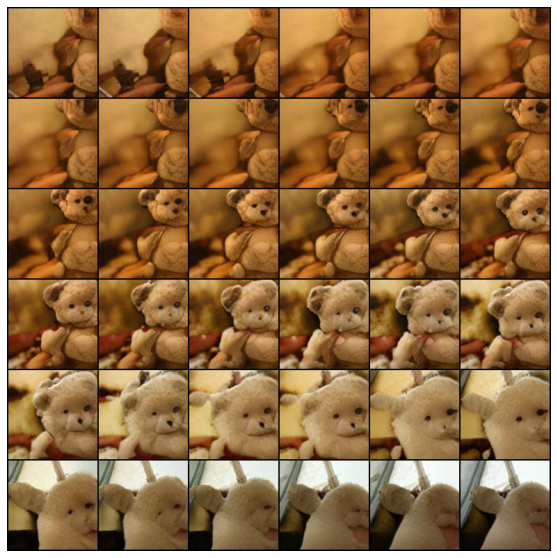

In [18]:
fig, ax = subplots(figsize=(10, 10))
img = mpimg.imread('%s/%s/langevin_samples.jpg' % (config['samples_root'], experiment_name))
ax.imshow(img)
ax.axis('off')
plt.show()

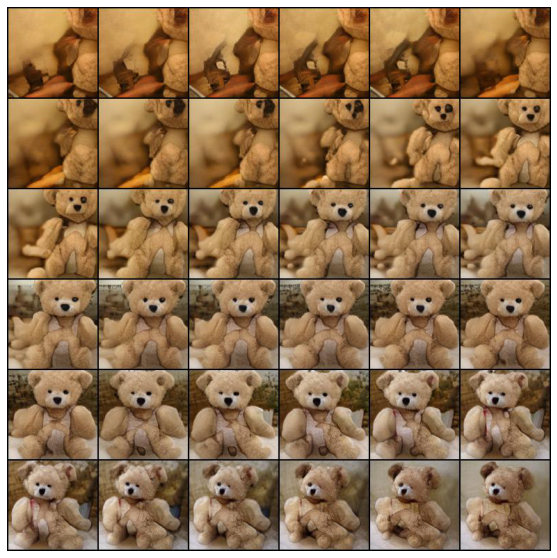

In [16]:
fig, ax = subplots(figsize=(10, 10))
img = mpimg.imread('%s/%s/langevin_samples.jpg' % (config['samples_root'], experiment_name))
ax.imshow(img)
ax.axis('off')
plt.show()

# MALA

In [13]:
def MALA_sampling(G, D, y_,
                  z_dim, eps, num_iter, device):
    loc = torch.zeros(z_dim).to(device)
    scale = torch.ones(z_dim).to(device)
    normal = Normal(loc, scale)
    diagn = Independent(normal, 1)
    uniform_sampler = Uniform(low = 0.0, high = 1.0)
    cur_z = diagn.sample()
    cur_z = torch.unsqueeze(cur_z, 0)
    cur_z.requires_grad_(True)
    latent_arr = [cur_z.clone()]
    
    y_shared = G.shared(y_)
    y_shared.detach()
    
    for i in range(num_iter):
        print(f"i = {i}")
        GAN_part = -D(G(cur_z, y_shared), y_)
        latent_part = -diagn.log_prob(cur_z)
        cur_energy = GAN_part + latent_part 
        cur_energy.backward()
        noise = diagn.sample()
        gamma = eps/2
        with torch.no_grad():
            new_z = (cur_z - gamma*cur_z.grad + (eps ** 0.5)*noise)
            
        new_z = new_z.clone()
        new_z.requires_grad_(True)
        new_energy = -D(G(new_z, y_shared), y_) - diagn.log_prob(new_z)
        new_energy.backward()
        energy_part = cur_energy - new_energy
        with torch.no_grad():
            vec_for_propose_2 = cur_z - new_z + gamma*new_z.grad

        propose_part_2 = (vec_for_propose_2.squeeze() @ vec_for_propose_2.squeeze())/4.0/gamma
        propose_part = (noise @ noise)/2.0 - propose_part_2
        log_accept_prob = propose_part + energy_part
        generate_uniform_var = uniform_sampler.sample().to(device)
        log_generate_uniform_var = torch.log(generate_uniform_var)
        if log_generate_uniform_var < log_accept_prob:
            latent_arr.append(new_z.clone())
            cur_z = new_z
            cur_z.grad.data.zero_()

    latent_arr = torch.stack(latent_arr, dim = 0)
    return latent_arr

In [25]:
cur_eps = 5e-3
z_.sample_()
z_dim = z_.shape[1]
num_class = 850
y_ = num_class*torch.ones((1, ), dtype=torch.long).to(z_.device)

print(f"MALA with eps = {cur_eps}")
latent_arr = MALA_sampling(G, D, y_,
                           z_dim, cur_eps, 
                           G_batch_size, z_.device)

MALA with eps = 0.005
i = 0
i = 1
i = 2
i = 3
i = 4
i = 5
i = 6
i = 7
i = 8
i = 9
i = 10
i = 11
i = 12
i = 13
i = 14
i = 15
i = 16
i = 17
i = 18
i = 19
i = 20
i = 21
i = 22
i = 23
i = 24
i = 25
i = 26
i = 27
i = 28
i = 29
i = 30
i = 31
i = 32
i = 33
i = 34
i = 35


In [26]:
latent_arr.shape

torch.Size([10, 1, 120])

In [27]:
latent_arr_squeeze = torch.squeeze(latent_arr)
y_ = num_class*torch.ones((latent_arr_squeeze.shape[0], ), 
                    dtype=torch.long).to(z_.device)
mala_samples =  G(latent_arr_squeeze, G.shared(y_))

In [28]:
torchvision.utils.save_image(mala_samples.float(),
                             '%s/%s/mala_samples.jpg' % (config['samples_root'], experiment_name),
                             nrow=int(latent_arr_squeeze.shape[0] ** 0.5),
                             normalize=True)

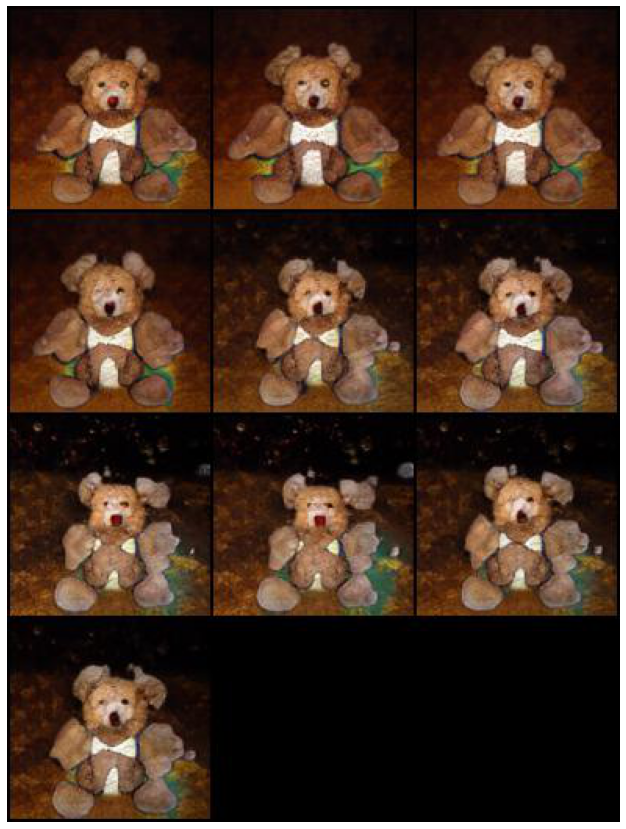

In [29]:
fig, ax = subplots(figsize=(15, 15))
img = mpimg.imread('%s/%s/mala_samples.jpg' % (config['samples_root'], experiment_name))
ax.imshow(img)
ax.axis('off')
plt.show()

# NUTS sampling

In [34]:
def calculate_energy(params, G, D, y_, y_shared):
    if params is not None:
        cur_params = params['points']
        
        return -D(G(cur_params, y_shared), y_) + (cur_params.squeeze() @ cur_params.squeeze())/2
    
    else:
        return torch.tensor([0.0])

def NUTS_sampling(G, D, y_, z_dim, num_samples, device):
    y_shared = G.shared(y_)
    y_shared.detach()
    
    cur_calculate_energy = partial(calculate_energy, 
                                   G = G,
                                   D = D,
                                   y_ = y_,
                                   y_shared = y_shared)
    kernel = NUTS(potential_fn = cur_calculate_energy)
    loc = torch.zeros(z_dim).to(device)
    scale = torch.ones(z_dim).to(device)
    normal = Normal(loc, scale)
    diagn = Independent(normal, 1)
    init_params = diagn.sample()
    init_params = torch.unsqueeze(init_params, 0)
    init_params = {'points': init_params}
    mcmc = MCMC(kernel = kernel, 
               num_samples = num_samples, 
               initial_params = init_params,
               num_chains = 1)
    mcmc.run()
    latent_arr = mcmc.get_samples()['points']
    
    return latent_arr, mcmc

In [35]:
num_class = 850
y_ = num_class*torch.ones((1, ), dtype=torch.long).to(z_.device)
latent_arr, mcmc = NUTS_sampling(G, D, y_, z_dim, 16, z_.device)

Sample: 100%|██████████| 32/32 [05:14,  9.83s/it, step size=1.26e-02, acc. prob=0.869]


In [38]:
latent_arr.shape

torch.Size([16, 1, 120])

In [39]:
latent_arr_squeeze = torch.squeeze(latent_arr)
y_ = num_class*torch.ones((latent_arr_squeeze.shape[0], ), 
                    dtype=torch.long).to(z_.device)
nuts_samples =  G(latent_arr_squeeze, G.shared(y_))

In [42]:
torchvision.utils.save_image(nuts_samples.float(),
                             '%s/%s/nuts_samples.jpg' % (config['samples_root'], experiment_name),
                             nrow=int(latent_arr_squeeze.shape[0] ** 0.5),
                             normalize=True)

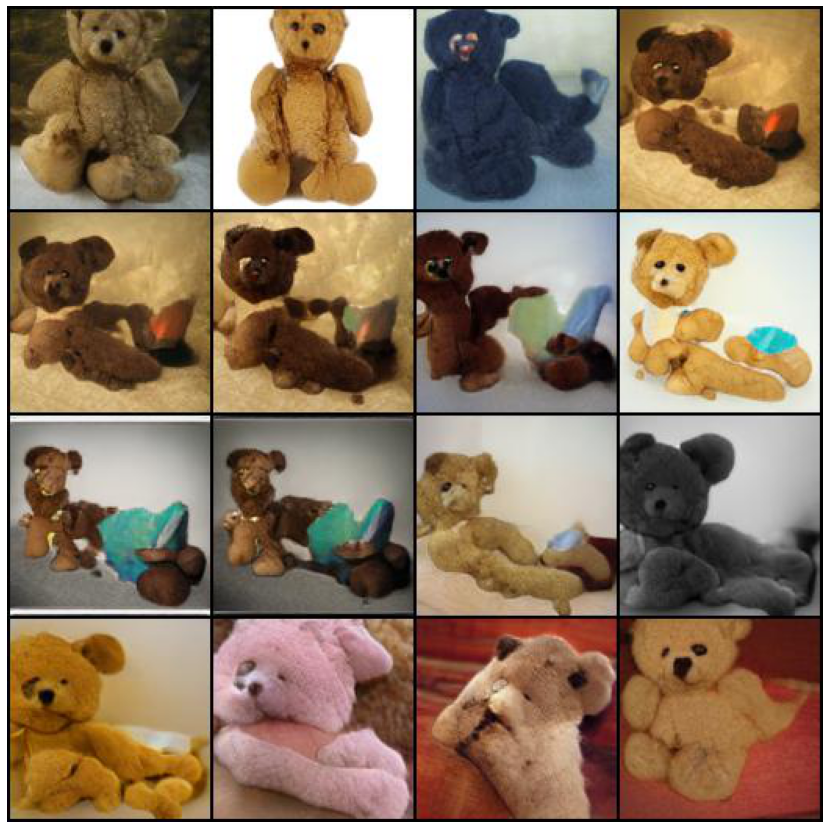

In [43]:
fig, ax = subplots(figsize=(15, 15))
img = mpimg.imread('%s/%s/nuts_samples.jpg' % (config['samples_root'], experiment_name))
ax.imshow(img)
ax.axis('off')
plt.show()

# Gibbs sampling 

In [8]:
z_.sample_()
z_dim = z_.shape[1]

In [9]:
def calculate_energy_beta(params, G, D, y_, y_shared, beta):
    if params is not None:
        cur_params = params['points']
        
        return -beta*D(G(cur_params, y_shared), y_) + (cur_params.squeeze() @ cur_params.squeeze())/2
    
    else:
        return torch.tensor([0.0])

In [10]:
def Gibbs_sampling(G, D, d, N, K, num_samples, eps, alpha, beta_arr, device, y_):
    y_shared = G.shared(y_)
    y_shared.detach()
    num_classes = y_
    
    R = len(beta_arr) - 1
    loc = torch.zeros(d).to(device)
    scale = torch.ones(d).to(device)
    normal = Normal(loc, scale)
    diagn = Independent(normal, 1)
    
    Y_init = diagn.sample((R + 1, ))
    X_cur = Y_init
    #print(X_cur.shape)
    
    i_0 = torch.randint(0, N, (1,))
    i_cur = i_0
    
    t_arr_probs = eps*torch.ones(K, N)
    t_arr = torch.bernoulli(t_arr_probs)
    is_null_t_arr = (t_arr == 0)
    z_arr = diagn.sample((K, N))
    
    history_X = [X_cur]
    beta_diff = beta_arr[1:] - beta_arr[:-1]
    beta_diff = beta_diff.to(device)
    #print(beta_diff.device)
    y_batch = num_class*torch.ones((R, ), dtype=torch.long).to(device)
    y_shared_batch = G.shared(y_batch)
    y_shared_batch.detach()

    for j in range(K):
        print(f"Gibbs step j = {j}")
        print(f"shape cur = {X_cur.shape}")
        X_matrix = torch.zeros((R + 1, N, d)).to(device)
        #print(X_matrix[:, i_cur, :].shape)
        X_matrix[:, i_cur, :] = X_cur.reshape((R + 1, 1, d))
        #not_null_indices = torch.nonzero(t_arr[k])
        #null_indices = torch.nonzero(is_null_t_arr[k])
        
        #bigger_than_i_cur_null_indices = null_indices[null_indices > i_cur]
        #less_than_i_cur_null_indices = null_indices[null_indices < i_cur]
        for l in range(i_cur + 1, N):
            if t_arr[j][l] == 0:
                X_matrix[0][l] = z_arr[j][l - 1]
            else:
                X_matrix[0][l] = alpha*X_matrix[0][l - 1] + ((1 - alpha**2)**0.5)*z_arr[j][l - 1]
                
        for l in range(i_cur - 1, -1, -1):
            if t_arr[j][l] == 0:
                X_matrix[0][l] = z_arr[j][l + 1]
            else:
                X_matrix[0][l] = alpha*X_matrix[0][l + 1] + ((1 - alpha**2)**0.5)*z_arr[j][l + 1]
        
        print("Start to do MCMC")
        for n in range(1, R + 1):
            print(f"n = {n}")
            cur_calculate_energy = partial(calculate_energy_beta, 
                                           G = G,
                                           D = D,
                                           y_ = y_,
                                           y_shared = y_shared, 
                                           beta = beta_arr[n])
            kernel = NUTS(potential_fn = cur_calculate_energy)
            for i in range(N):
                if i != i_cur:
                    print(f"i = {i}")
                    init_params = torch.unsqueeze(X_matrix[n - 1][i], 0)
                    init_params = {'points': init_params}
                    mcmc = MCMC(kernel = kernel, 
                                num_samples = num_samples, 
                                initial_params = init_params,
                                num_chains = 1)
                    mcmc.run()
                    X_matrix[n][i] = mcmc.get_samples()['points'][-1]
        
        print("Calculating weights")
        weights_arr = []
        
        for l in range(N):
            cur_chain = X_matrix[:R, l, :]
            D_G_cur_chain = D(G(cur_chain, y_shared_batch), y_batch)
            #print(D_G_cur_chain.device)
            #print(beta_diff.device)
            
            cur_weight = torch.exp((beta_diff * D_G_cur_chain).sum())
            weights_arr.append(cur_weight)
        
        weights_arr = torch.stack(weights_arr, dim = 0)
        
        i_cur = torch.multinomial(weights_arr, 1, replacement=True)
        print(f"weights = {weights_arr.detach().cpu().numpy()}")
        print(f"select index = {i_cur.float()}")
        X_cur = torch.squeeze(X_matrix[:, i_cur, :])
        print(f"shape next = {X_cur.shape}")
        history_X.append(X_cur)
        
    return history_X

In [11]:
N = 2
K = 5
R = 5
num_samples = 10

alpha = 0.95
eps = 0.2

delta = 4.
sigmoid_input = delta*(2.*torch.arange(0, R + 1)/R - 1.)
beta_tilde = torch.sigmoid(sigmoid_input)

beta_arr = (beta_tilde - beta_tilde[0])/(beta_tilde[-1] - beta_tilde[0])

num_class = 850
y_ = num_class*torch.ones((1, ), dtype=torch.long).to(device)

samples = Gibbs_sampling(G, D, z_dim, N, K, num_samples, eps, alpha, beta_arr, device, y_)

Warmup:   0%|          | 0/20 [00:00, ?it/s]

Gibbs step j = 0
shape cur = torch.Size([6, 120])
Start to do MCMC
n = 1
i = 1


Warmup:   0%|          | 0/20 [00:00, ?it/s]

n = 2
i = 1


Warmup:   0%|          | 0/20 [00:00, ?it/s]

n = 3
i = 1


Warmup:   0%|          | 0/20 [00:00, ?it/s]

n = 4
i = 1


Warmup:   0%|          | 0/20 [00:00, ?it/s]

n = 5
i = 1


Sample: 100%|██████████| 20/20 [05:39, 16.99s/it, step size=1.11e-02, acc. prob=0.838]


Calculating weights


Warmup:   0%|          | 0/20 [00:00, ?it/s]

weights = [8.0264160e-09 3.1496927e-03]
select index = tensor([1.], device='cuda:0')
shape next = torch.Size([6, 120])
Gibbs step j = 1
shape cur = torch.Size([6, 120])
Start to do MCMC
n = 1
i = 0


Warmup:   0%|          | 0/20 [00:00, ?it/s]

n = 2
i = 0


Warmup:   0%|          | 0/20 [00:00, ?it/s]

n = 3
i = 0


Warmup:   0%|          | 0/20 [00:00, ?it/s]

n = 4
i = 0


Warmup:   0%|          | 0/20 [00:00, ?it/s]

n = 5
i = 0


Warmup:   0%|          | 0/20 [00:00, ?it/s]

Calculating weights
weights = [0.00056939 0.00314969]
select index = tensor([1.], device='cuda:0')
shape next = torch.Size([6, 120])
Gibbs step j = 2
shape cur = torch.Size([6, 120])
Start to do MCMC
n = 1
i = 0


Warmup:   0%|          | 0/20 [00:00, ?it/s]

n = 2
i = 0


Warmup:   0%|          | 0/20 [00:00, ?it/s]

n = 3
i = 0


Warmup:   0%|          | 0/20 [00:00, ?it/s]

n = 4
i = 0


Warmup:   0%|          | 0/20 [00:00, ?it/s]

n = 5
i = 0


Warmup:   0%|          | 0/20 [00:00, ?it/s]

Calculating weights
weights = [0.00253864 0.00314969]
select index = tensor([0.], device='cuda:0')
shape next = torch.Size([6, 120])
Gibbs step j = 3
shape cur = torch.Size([6, 120])
Start to do MCMC
n = 1
i = 1


Warmup:   0%|          | 0/20 [00:00, ?it/s]

n = 2
i = 1


Warmup:   0%|          | 0/20 [00:00, ?it/s]

n = 3
i = 1


Warmup:   0%|          | 0/20 [00:00, ?it/s]

n = 4
i = 1


Warmup:   0%|          | 0/20 [00:00, ?it/s]

n = 5
i = 1


Warmup:   0%|          | 0/20 [00:00, ?it/s]

Calculating weights
weights = [0.00253864 0.12388869]
select index = tensor([1.], device='cuda:0')
shape next = torch.Size([6, 120])
Gibbs step j = 4
shape cur = torch.Size([6, 120])
Start to do MCMC
n = 1
i = 0


Warmup:   0%|          | 0/20 [00:00, ?it/s]

n = 2
i = 0


Warmup:   0%|          | 0/20 [00:00, ?it/s]

n = 3
i = 0


Warmup:   0%|          | 0/20 [00:00, ?it/s]

n = 4
i = 0


Warmup:   0%|          | 0/20 [00:00, ?it/s]

n = 5
i = 0


Sample: 100%|██████████| 20/20 [02:52,  8.61s/it, step size=1.52e-02, acc. prob=0.693]

Calculating weights
weights = [0.00085703 0.12388869]
select index = tensor([1.], device='cuda:0')
shape next = torch.Size([6, 120])


In [12]:
samples_stack = torch.stack(samples, dim = 0)

In [13]:
samples_stack.shape

torch.Size([6, 6, 120])

In [193]:
samples_reshape = samples_stack.reshape((samples_stack.shape[0]*samples_stack.shape[1], z_dim))

In [194]:
samples_reshape.shape

torch.Size([9, 120])

In [195]:
y_batch = num_class*torch.ones((samples_reshape.shape[0], ), dtype=torch.long).to(device)
y_shared_batch = G.shared(y_batch)
y_shared_batch.detach()

tensor([[-0.0221,  0.1402,  0.1338,  ...,  0.0183,  0.1009, -0.2002],
        [-0.0221,  0.1402,  0.1338,  ...,  0.0183,  0.1009, -0.2002],
        [-0.0221,  0.1402,  0.1338,  ...,  0.0183,  0.1009, -0.2002],
        ...,
        [-0.0221,  0.1402,  0.1338,  ...,  0.0183,  0.1009, -0.2002],
        [-0.0221,  0.1402,  0.1338,  ...,  0.0183,  0.1009, -0.2002],
        [-0.0221,  0.1402,  0.1338,  ...,  0.0183,  0.1009, -0.2002]],
       device='cuda:0')

In [14]:
last_samples = samples_stack[-1]

In [16]:
last_samples.shape

torch.Size([6, 120])

In [17]:
y_batch = num_class*torch.ones((last_samples.shape[0], ), dtype=torch.long).to(device)
y_shared_batch = G.shared(y_batch)
y_shared_batch.detach()
gibbs_samples =  G(last_samples, y_shared_batch)
torchvision.utils.save_image(gibbs_samples.float(),
                             '%s/%s/gibbs_samples_2.jpg' % (config['samples_root'], experiment_name),
                             nrow=3,
                             normalize=True)

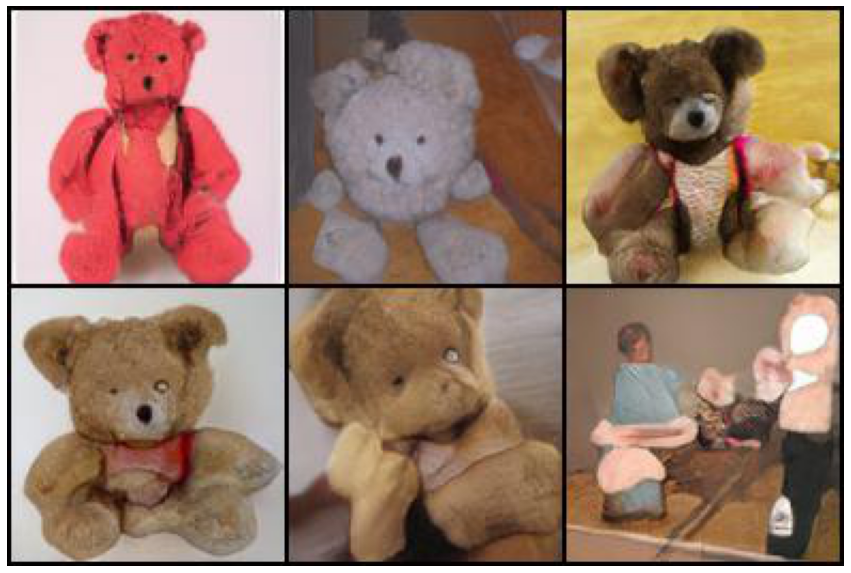

j = 5


In [19]:
fig, ax = subplots(figsize=(15, 15))
img = mpimg.imread('%s/%s/gibbs_samples_2.jpg' % (config['samples_root'], experiment_name))
ax.imshow(img)
ax.axis('off')
plt.show()
print("j = 5")

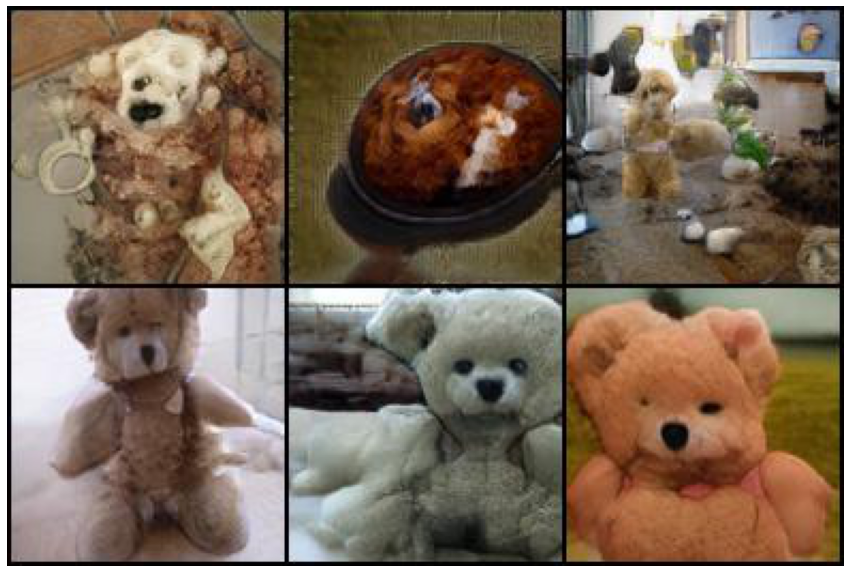

j = 0


In [20]:
last_samples = samples_stack[0]
y_batch = num_class*torch.ones((last_samples.shape[0], ), dtype=torch.long).to(device)
y_shared_batch = G.shared(y_batch)
y_shared_batch.detach()
gibbs_samples =  G(last_samples, y_shared_batch)
file_name = '%s/%s/gibbs_samples_3.jpg' % (config['samples_root'], experiment_name)
torchvision.utils.save_image(gibbs_samples.float(),
                             file_name,
                             nrow=3,
                             normalize=True)
fig, ax = subplots(figsize=(15, 15))
img = mpimg.imread(file_name)
ax.imshow(img)
ax.axis('off')
plt.show()
print("j = 0")

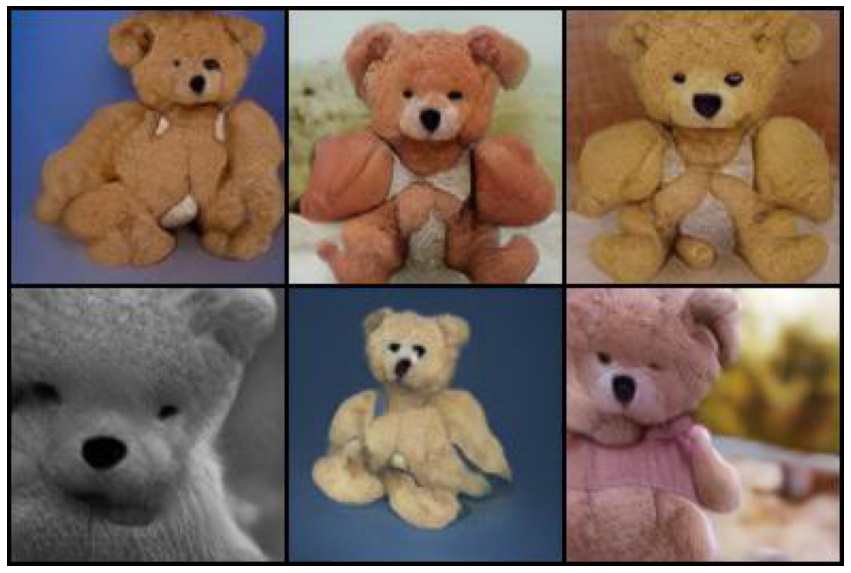

j = 4


In [24]:
last_samples = samples_stack[3]
y_batch = num_class*torch.ones((last_samples.shape[0], ), dtype=torch.long).to(device)
y_shared_batch = G.shared(y_batch)
y_shared_batch.detach()
gibbs_samples =  G(last_samples, y_shared_batch)
file_name = '%s/%s/gibbs_samples_5.jpg' % (config['samples_root'], experiment_name)
torchvision.utils.save_image(gibbs_samples.float(),
                             file_name,
                             nrow=3,
                             normalize=True)
fig, ax = subplots(figsize=(15, 15))
img = mpimg.imread(file_name)
ax.imshow(img)
ax.axis('off')
plt.show()
print("j = 3")

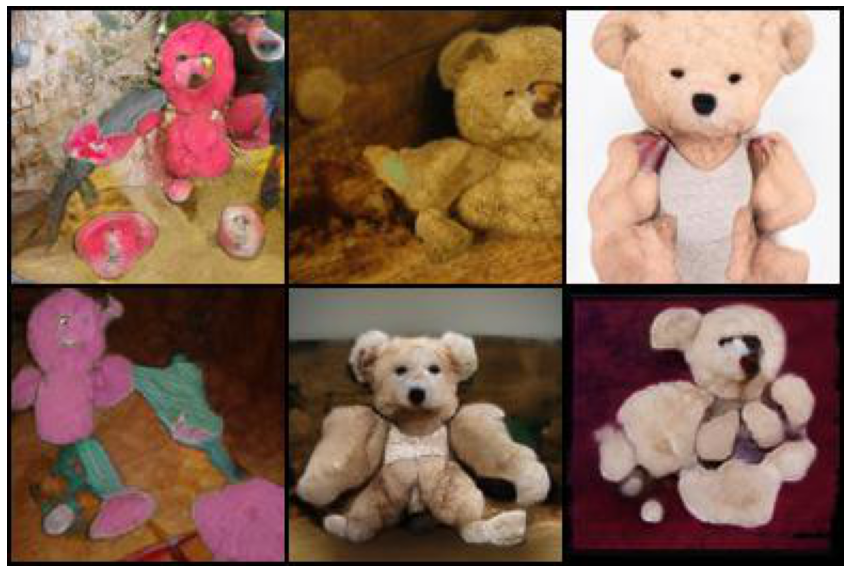

j = 2


In [25]:
last_samples = samples_stack[2]
y_batch = num_class*torch.ones((last_samples.shape[0], ), dtype=torch.long).to(device)
y_shared_batch = G.shared(y_batch)
y_shared_batch.detach()
gibbs_samples =  G(last_samples, y_shared_batch)
file_name = '%s/%s/gibbs_samples_5.jpg' % (config['samples_root'], experiment_name)
torchvision.utils.save_image(gibbs_samples.float(),
                             file_name,
                             nrow=3,
                             normalize=True)
fig, ax = subplots(figsize=(15, 15))
img = mpimg.imread(file_name)
ax.imshow(img)
ax.axis('off')
plt.show()
print("j = 2")

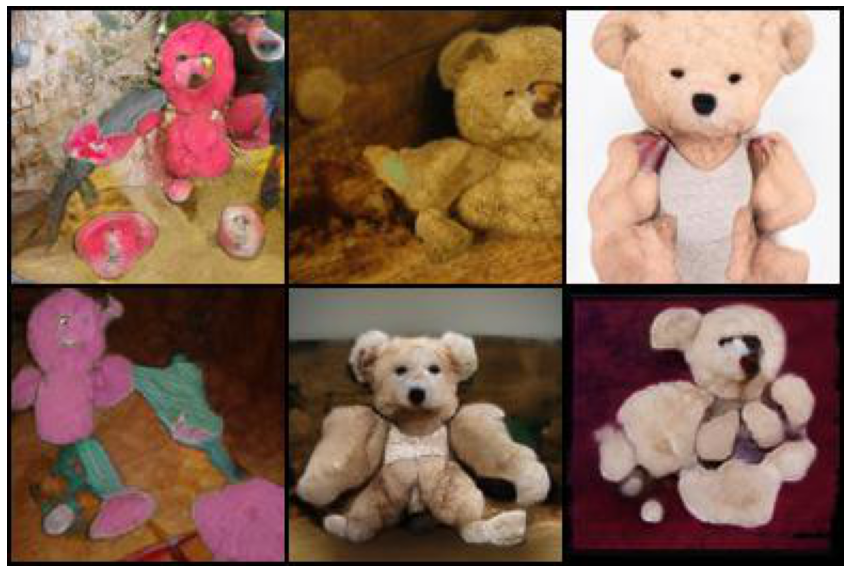

j = 1


In [26]:
last_samples = samples_stack[1]
y_batch = num_class*torch.ones((last_samples.shape[0], ), dtype=torch.long).to(device)
y_shared_batch = G.shared(y_batch)
y_shared_batch.detach()
gibbs_samples =  G(last_samples, y_shared_batch)
file_name = '%s/%s/gibbs_samples_5.jpg' % (config['samples_root'], experiment_name)
torchvision.utils.save_image(gibbs_samples.float(),
                             file_name,
                             nrow=3,
                             normalize=True)
fig, ax = subplots(figsize=(15, 15))
img = mpimg.imread(file_name)
ax.imshow(img)
ax.axis('off')
plt.show()
print("j = 1")

In [196]:
gibbs_samples =  G(samples_reshape, y_shared_batch)

In [197]:
torchvision.utils.save_image(gibbs_samples.float(),
                             '%s/%s/gibbs_samples.jpg' % (config['samples_root'], experiment_name),
                             nrow=int(samples_reshape.shape[0] ** 0.5),
                             normalize=True)

Warmup:   0%|          | 0/10 [31:08, ?it/s]


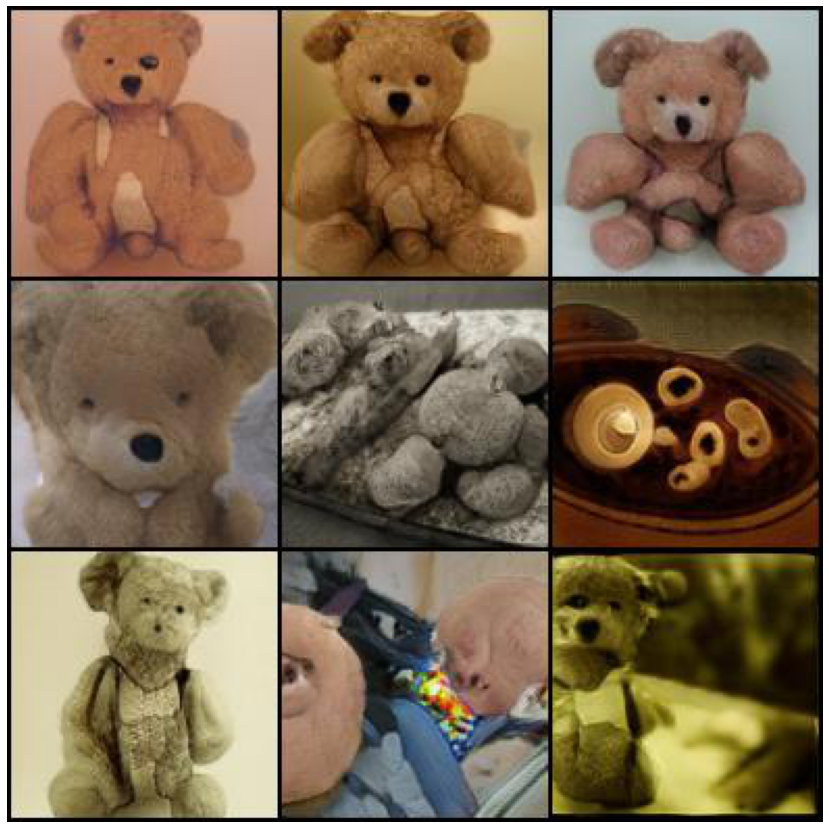

In [198]:
fig, ax = subplots(figsize=(15, 15))
img = mpimg.imread('%s/%s/gibbs_samples.jpg' % (config['samples_root'], experiment_name))
ax.imshow(img)
ax.axis('off')
plt.show()